In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
from utils_sound import *

## Simple wave plots

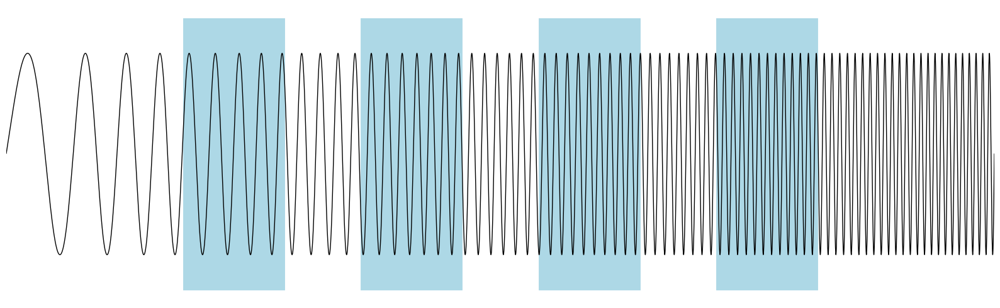

In [100]:
# Parameters
min_freq = .1  # Hz
max_freq = 1.5 # Hz
total_time = 100 # seconds
max_points_per_cycle = 1000
sampling_freq = max_points_per_cycle * min_freq   # Calculate the sampling frequency such that 20 timepoints correspond to a full cycle at the lowest frequency
t_sample = 1  # seconds, window size

# Generate the signal
t, signal, instantaneous_freq = generate_varying_freq_signal(min_freq, max_freq, sampling_freq, total_time)

# Plotting
fig, ax = plt.subplots(figsize=(16, 5))

ax.plot(t, signal*0.75, color='k', linewidth=1)

# Define number of windows and their spacing
num_windows = 4
spacing = total_time / (num_windows + 1)
window_size = t_sample*10

# Add distinct windows with aesthetic rectangles
for i in range(1, num_windows + 1):
    start = i * spacing * 0.9
    rect = Rectangle((start, -1), window_size, 2, facecolor='lightblue', edgecolor='lightblue', linewidth=3.5, alpha=1)
    ax.add_patch(rect)

# Aesthetic adjustments
ax.set_xlim(0, total_time)
ax.set_ylim(-1.1, 1.1)
ax.axis('off')
plt.tight_layout()
plt.savefig('plots/fig4/A_signal.svg', dpi=600)
plt.show()

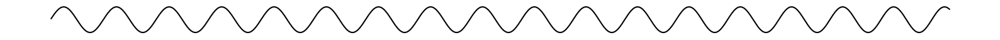

In [96]:
# Parameters
min_freq = 10  # Hz
max_freq = 80 # Hz
total_time = 100 # seconds
max_points_per_cycle = 100
sampling_freq = max_points_per_cycle * min_freq   # Calculate the sampling frequency such that 20 timepoints correspond to a full cycle at the lowest frequency
t_sample = 1  # seconds, window size

# Generate the signal
t, signal, instantaneous_freq = generate_varying_freq_signal(min_freq, max_freq, sampling_freq, total_time)

data = sliding_window_dataset(signal, t_sample, sampling_freq)

plt.figure(figsize=(16,.75))
plt.plot(data[10000], color='k')
plt.axis('off')
plt.tight_layout()
plt.savefig('plots/fig4/A_wave.svg', dpi=600)
plt.show()

## Receptive fields

In [2]:
# Parameters
min_freq = 10  # Hz
max_freq = 80 # Hz
total_time = 100 # seconds
max_points_per_cycle = 100
sampling_freq = max_points_per_cycle * min_freq   # Calculate the sampling frequency such that 20 timepoints correspond to a full cycle at the lowest frequency
t_sample = 1  # seconds, window size
delta_freq = 0.1

# Generate the signal
t, signal, instantaneous_freq = generate_varying_freq_signal(min_freq, max_freq, sampling_freq, total_time)

# Generate the dataset using sliding window (uniform distribution)
data = sliding_window_dataset(signal, t_sample, sampling_freq)

dataset = create_dataloader(data, batch_size=256, reshuffle_after_epoch=True)

In [3]:
model_dense = ConvAE(n_hidden=100, sample_length=data.shape[1], kernel_size=max_points_per_cycle)
model_dense = torch.load('saved_models/AEfreq_hidden1e2_kernel1e2_lr1e-4_epochs1e3_alpha0_v2.pth')

model_sparse = ConvAE(n_hidden=100, sample_length=data.shape[1], kernel_size=max_points_per_cycle)
model_sparse = torch.load('saved_models/AEfreq_hidden1e2_kernel1e2_lr1e-4_epochs1e3_alpha1e4.pth')

In [4]:
test_dataset = create_test_dataset(freq_range=(min_freq, max_freq), delta_freq=delta_freq, sample_length=data.shape[1])

embeddings_dense = clean_embeddings(get_embeddings(test_dataset, model_dense))
embeddings_sparse = clean_embeddings(get_embeddings(test_dataset, model_sparse))

In [5]:
sorted_embeddings_dense = normalize_and_reorder(embeddings_dense)
sorted_embeddings_sparse = normalize_and_reorder(embeddings_sparse)

### Without Gaussian smoothing

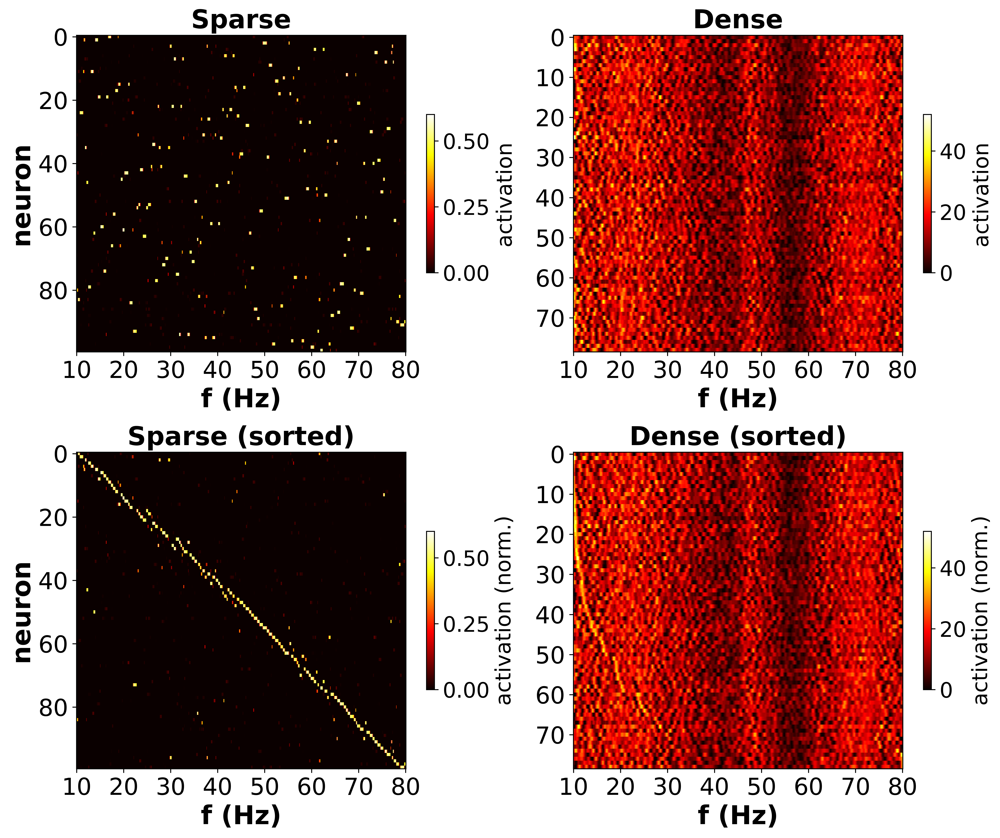

In [16]:
# Increase figure DPI for higher resolution
plt.figure(figsize=(12, 10), dpi=600)

# Define font sizes and other style parameters
fontsize_labels = 22
fontsize_ticks = 20
fontsize_title = 22
fontsize_colorbar = 18
shrink_colorbar = 0.5
interpolation = 'none'
cmap = 'hot' #'jet'

# Plot sparse embeddings (original)
plt.subplot(2, 2, 1)
plt.imshow(embeddings_sparse.T, aspect='auto', cmap=cmap, origin='upper', interpolation=interpolation)
plt.title('Sparse', fontsize=fontsize_title, fontweight='bold')
cbar = plt.colorbar(shrink=shrink_colorbar)
cbar.set_label(label='activation', size=fontsize_colorbar)
cbar.ax.tick_params(labelsize=fontsize_colorbar)
plt.xlabel('f (Hz)', fontsize=fontsize_labels, fontweight='bold')
plt.ylabel('neuron', fontsize=fontsize_labels, fontweight='bold')
plt.xticks(np.linspace(0, test_dataset.shape[0] - 1, 8), np.linspace(min_freq, max_freq, 8).astype(int), fontsize=fontsize_ticks)
plt.yticks(fontsize=fontsize_ticks)

# Plot sparse embeddings (sorted)
plt.subplot(2, 2, 3)
plt.imshow(sorted_embeddings_sparse.T, aspect='auto', cmap=cmap, origin='upper', interpolation=interpolation)
plt.title('Sparse (sorted)', fontsize=fontsize_title, fontweight='bold')
cbar = plt.colorbar(shrink=shrink_colorbar)
cbar.set_label(label='activation (norm.)', size=fontsize_colorbar)
cbar.ax.tick_params(labelsize=fontsize_colorbar)
plt.xlabel('f (Hz)', fontsize=fontsize_labels, fontweight='bold')
plt.ylabel('neuron', fontsize=fontsize_labels, fontweight='bold')
plt.xticks(np.linspace(0, test_dataset.shape[0] - 1, 8), np.linspace(min_freq, max_freq, 8).astype(int), fontsize=fontsize_ticks)
plt.yticks(fontsize=fontsize_ticks)

# Plot dense embeddings (original)
plt.subplot(2, 2, 2)
plt.imshow(embeddings_dense.T, aspect='auto', cmap=cmap, origin='upper', interpolation=interpolation)
plt.title('Dense', fontsize=fontsize_title, fontweight='bold')
cbar = plt.colorbar(shrink=shrink_colorbar)
cbar.set_label(label='activation', size=fontsize_colorbar)
cbar.ax.tick_params(labelsize=fontsize_colorbar)
plt.xlabel('f (Hz)', fontsize=fontsize_labels, fontweight='bold')
plt.xticks(np.linspace(0, test_dataset.shape[0] - 1, 8), np.linspace(min_freq, max_freq, 8).astype(int), fontsize=fontsize_ticks)
plt.yticks(fontsize=fontsize_ticks)

# Plot dense embeddings (sorted)
plt.subplot(2, 2, 4)
plt.imshow(sorted_embeddings_dense.T, aspect='auto', cmap=cmap, origin='upper', interpolation=interpolation)
plt.title('Dense (sorted)', fontsize=fontsize_title, fontweight='bold')
cbar = plt.colorbar(shrink=shrink_colorbar)
cbar.set_label(label='activation (norm.)', size=fontsize_colorbar)
cbar.ax.tick_params(labelsize=fontsize_colorbar)
plt.xlabel('f (Hz)', fontsize=fontsize_labels, fontweight='bold')
plt.xticks(np.linspace(0, test_dataset.shape[0] - 1, 8), np.linspace(min_freq, max_freq, 8).astype(int), fontsize=fontsize_ticks)
plt.yticks(fontsize=fontsize_ticks)

# Adjust layout for better spacing
plt.tight_layout()

#plt.savefig('plots/fig4/B_freqField.svg', format='pdf', bbox_inches='tight')
#plt.savefig('plots/fig4/B_freqField.jpg', dpi=900)
#plt.savefig('plots/fig4/B_freqField.eps', format='eps', bbox_inches='tight')

# Show the plot
plt.show()

### With Gaussian smoothing and interpolation

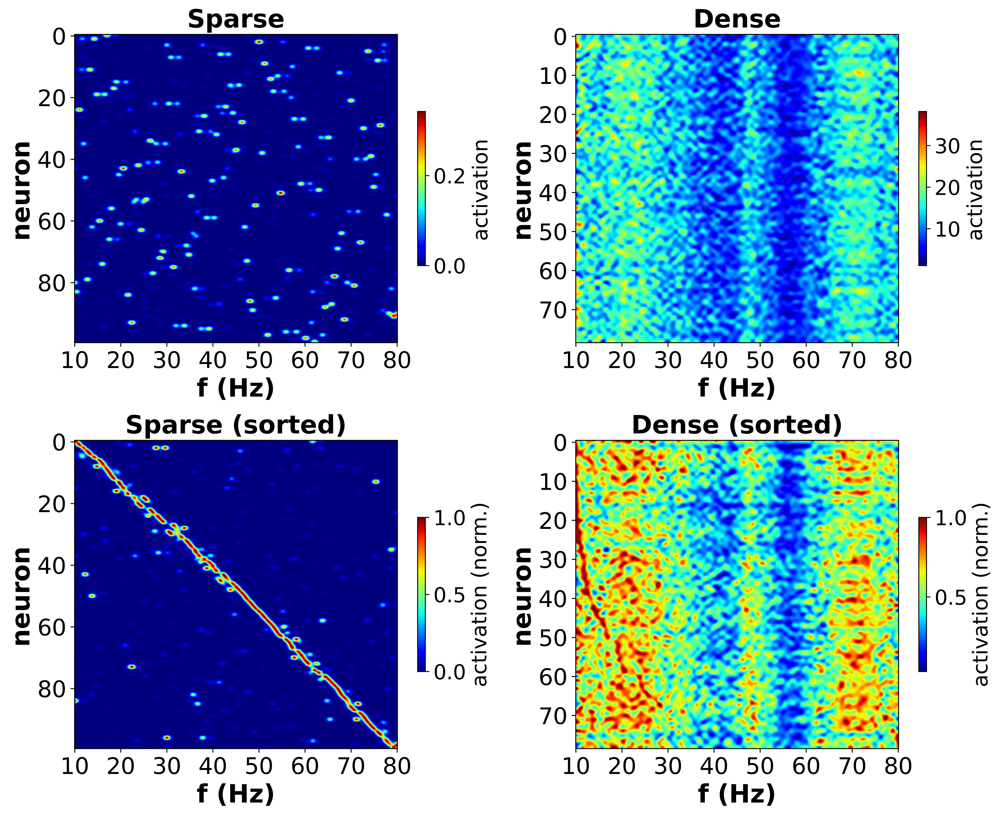

In [6]:
from scipy.ndimage import gaussian_filter1d

# Increase figure DPI for higher resolution
plt.figure(figsize=(12.3, 10), dpi=600)

# Define font sizes and other style parameters
fontsize_labels = 22
fontsize_ticks = 20
fontsize_title = 22
fontsize_colorbar = 18
shrink_colorbar = 0.5
interpolation = 'lanczos'
cmap = 'jet' #'jet'
sigma = 5

# Plot sparse embeddings (original)
plt.subplot(2, 2, 1)
embeddings_sparse_smooth = gaussian_filter1d(embeddings_sparse, sigma=sigma, axis=0)
plt.imshow(embeddings_sparse_smooth.T, aspect='auto', cmap=cmap, origin='upper', interpolation=interpolation)
plt.title('Sparse', fontsize=fontsize_title, fontweight='bold')
cbar = plt.colorbar(shrink=shrink_colorbar)
cbar.set_label(label='activation', size=fontsize_colorbar)
cbar.ax.tick_params(labelsize=fontsize_colorbar)
plt.xlabel('f (Hz)', fontsize=fontsize_labels, fontweight='bold')
plt.ylabel('neuron', fontsize=fontsize_labels, fontweight='bold')
plt.xticks(np.linspace(0, test_dataset.shape[0] - 1, 8), np.linspace(min_freq, max_freq, 8).astype(int), fontsize=fontsize_ticks)
plt.yticks(fontsize=fontsize_ticks)

# Plot sparse embeddings (sorted)
plt.subplot(2, 2, 3)
sorted_embeddings_sparse_smooth = gaussian_filter1d(sorted_embeddings_sparse, sigma=sigma, axis=0)
sorted_embeddings_sparse_smooth_norm = sorted_embeddings_sparse_smooth / sorted_embeddings_sparse_smooth.max(axis=0)
plt.imshow(sorted_embeddings_sparse_smooth_norm.T, aspect='auto', cmap=cmap, origin='upper', interpolation=interpolation)
plt.title('Sparse (sorted)', fontsize=fontsize_title, fontweight='bold')
cbar = plt.colorbar(shrink=shrink_colorbar)
cbar.set_label(label='activation (norm.)', size=fontsize_colorbar)
cbar.ax.tick_params(labelsize=fontsize_colorbar)
plt.xlabel('f (Hz)', fontsize=fontsize_labels, fontweight='bold')
plt.ylabel('neuron', fontsize=fontsize_labels, fontweight='bold')
plt.xticks(np.linspace(0, test_dataset.shape[0] - 1, 8), np.linspace(min_freq, max_freq, 8).astype(int), fontsize=fontsize_ticks)
plt.yticks(fontsize=fontsize_ticks)

# Plot dense embeddings (original)
plt.subplot(2, 2, 2)
embeddings_dense_smooth = gaussian_filter1d(embeddings_dense, sigma=sigma, axis=0)
plt.imshow(embeddings_dense_smooth.T, aspect='auto', cmap=cmap, origin='upper', interpolation=interpolation)
plt.title('Dense', fontsize=fontsize_title, fontweight='bold')
cbar = plt.colorbar(shrink=shrink_colorbar)
cbar.set_label(label='activation', size=fontsize_colorbar)
cbar.ax.tick_params(labelsize=fontsize_colorbar)
plt.xlabel('f (Hz)', fontsize=fontsize_labels, fontweight='bold')
plt.ylabel('neuron', fontsize=fontsize_labels, fontweight='bold')
plt.xticks(np.linspace(0, test_dataset.shape[0] - 1, 8), np.linspace(min_freq, max_freq, 8).astype(int), fontsize=fontsize_ticks)
plt.yticks(fontsize=fontsize_ticks)

# Plot dense embeddings (sorted)
plt.subplot(2, 2, 4)
sorted_embeddings_dense_smooth = gaussian_filter1d(sorted_embeddings_dense, sigma=sigma, axis=0)
sorted_embeddings_dense_smooth_norm = sorted_embeddings_dense_smooth / sorted_embeddings_dense_smooth.max(axis=0)
plt.imshow(sorted_embeddings_dense_smooth_norm.T, aspect='auto', cmap=cmap, origin='upper', interpolation=interpolation)
plt.title('Dense (sorted)', fontsize=fontsize_title, fontweight='bold')
cbar = plt.colorbar(shrink=shrink_colorbar)
cbar.set_label(label='activation (norm.)', size=fontsize_colorbar)
cbar.ax.tick_params(labelsize=fontsize_colorbar)
plt.xlabel('f (Hz)', fontsize=fontsize_labels, fontweight='bold')
plt.ylabel('neuron', fontsize=fontsize_labels, fontweight='bold')
plt.xticks(np.linspace(0, test_dataset.shape[0] - 1, 8), np.linspace(min_freq, max_freq, 8).astype(int), fontsize=fontsize_ticks)
plt.yticks(fontsize=fontsize_ticks)

# Adjust layout for better spacing
plt.tight_layout()

#plt.savefig('plots/fig4/B_freqField.svg', format='pdf', bbox_inches='tight')
#plt.savefig('plots/fig4/B_freqField.jpg', dpi=900)
#plt.savefig('plots/fig4/B_freqField.eps', format='eps', bbox_inches='tight')

# Show the plot
plt.show()

## Unbalanced dataset

In [7]:
model_biased = ConvAE(n_hidden=100, sample_length=data.shape[1], kernel_size=max_points_per_cycle)
model_biased = torch.load('saved_models/AEfreq_biased_hidden1e2_kernel1e2_lr1e-4_epochs4e3_alpha1e4.pth')

In [8]:
hidden_activations_biased = clean_embeddings(get_embeddings(test_dataset, model_biased))
sorted_hidden_activation_biased = normalize_and_reorder(hidden_activations_biased).T

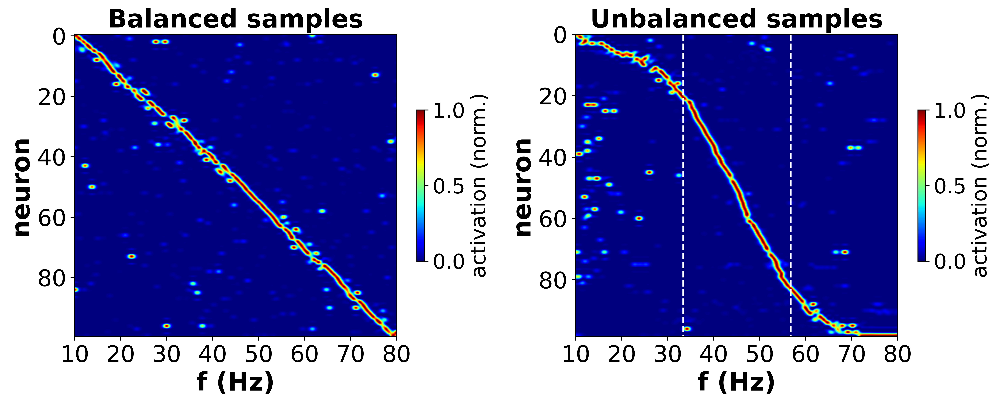

In [32]:
# Increase figure DPI for higher resolution
plt.figure(figsize=(12.3, 5), dpi=600)

# Define font sizes and other style parameters
fontsize_labels = 22
fontsize_ticks = 20
fontsize_title = 22
fontsize_colorbar = 18
shrink_colorbar = 0.5
interpolation = 'lanczos'
cmap = 'jet' #'jet'
sigma = 5


# Plot sparse embeddings (sorted)
plt.subplot(1, 2, 1)
sorted_embeddings_sparse_smooth = gaussian_filter1d(sorted_embeddings_sparse, sigma=sigma, axis=0)
sorted_embeddings_sparse_smooth_norm = sorted_embeddings_sparse_smooth / sorted_embeddings_sparse_smooth.max(axis=0)
plt.imshow(sorted_embeddings_sparse_smooth_norm.T, aspect='auto', cmap=cmap, origin='upper', interpolation=interpolation)
plt.title('Balanced samples', fontsize=fontsize_title, fontweight='bold')
cbar = plt.colorbar(shrink=shrink_colorbar)
cbar.set_label(label='activation (norm.)', size=fontsize_colorbar)
cbar.ax.tick_params(labelsize=fontsize_colorbar)
plt.xlabel('f (Hz)', fontsize=fontsize_labels, fontweight='bold')
plt.ylabel('neuron', fontsize=fontsize_labels, fontweight='bold')
plt.xticks(np.linspace(0, test_dataset.shape[0] - 1, 8), np.linspace(min_freq, max_freq, 8).astype(int), fontsize=fontsize_ticks)
plt.yticks(fontsize=fontsize_ticks)


# Plot sparse embeddings unbalanced (sorted)
plt.subplot(1, 2, 2)
sorted_hidden_activation_biased_smooth = gaussian_filter1d(sorted_hidden_activation_biased.T, sigma=sigma, axis=0)
sorted_hidden_activation_biased_smooth_norm = sorted_hidden_activation_biased_smooth / sorted_hidden_activation_biased_smooth.max(axis=0)
plt.imshow(sorted_hidden_activation_biased_smooth_norm.T, aspect='auto', cmap=cmap, origin='upper', interpolation=interpolation)
plt.title('Unbalanced samples', fontsize=fontsize_title, fontweight='bold')
cbar = plt.colorbar(shrink=shrink_colorbar)
cbar.set_label(label='activation (norm.)', size=fontsize_colorbar)
cbar.ax.tick_params(labelsize=fontsize_colorbar)
plt.xlabel('f (Hz)', fontsize=fontsize_labels, fontweight='bold')
plt.ylabel('neuron', fontsize=fontsize_labels, fontweight='bold')
plt.xticks(np.linspace(0, test_dataset.shape[0] - 1, 8), np.linspace(min_freq, max_freq, 8).astype(int), fontsize=fontsize_ticks)
plt.yticks(fontsize=fontsize_ticks)

min_freq = 10  # Hz
max_freq = 80  # Hz
mean_freq = (max_freq+min_freq)/2  # so that mean is the center of the range
std_freq = (mean_freq-min_freq)/3  # so that 2 std correspond to extremes of the range

plt.vlines([(mean_freq-std_freq-min_freq)/delta_freq, (mean_freq+std_freq-min_freq)/delta_freq],
           ymin=0, ymax=sorted_hidden_activation_biased_smooth_norm.shape[1], colors='white', linestyles='dashed')
plt.ylim(sorted_hidden_activation_biased_smooth_norm.shape[1]-0.5, 0)


# Adjust layout for better spacing
plt.tight_layout()

#plt.savefig('plots/fig4/B_freqField.svg', format='pdf', bbox_inches='tight')
plt.savefig('plots/fig4/D_freqFieldBiased.jpg', dpi=900)
#plt.savefig('plots/fig4/B_freqField.eps', format='eps', bbox_inches='tight')

# Show the plot
plt.show()

## Feature extraction

In [41]:
features_sparse = extract_feature_images(model_sparse, embeddings_sparse, clamping_value='max_unit')
features_dense = extract_feature_images(model_dense, embeddings_dense, clamping_value='max_unit')

In [40]:
np.random.choice(np.arange(features_sparse.shape[0]), 16, replace=False)

array([74, 16, 18, 80, 63, 12, 82, 57, 28, 40, 90, 31, 49, 97, 93, 84])

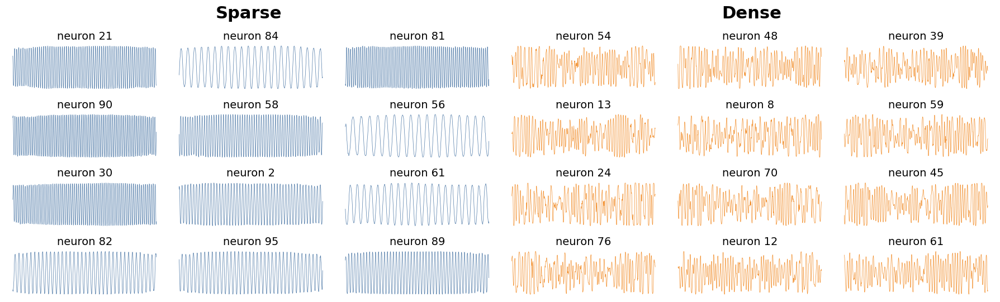

In [52]:
# Define the colors
colors = {'sparse': '#4E79A7', 'dense': '#F28E2B'}

# Create a larger figure
plt.figure(figsize=(18, 5.5))

# Number of subplots to sample
num_plots = 12

# Randomly select indices for sparse features
indxs_sparse = np.random.choice(np.arange(features_sparse.shape[0]), num_plots, replace=False).astype(int)
# Plot the sparse features (left 4x3 grid)
for i, indx in enumerate(indxs_sparse):
    row = i // 3
    col = i % 3
    plt.subplot(4, 6, row * 6 + col + 1)
    plt.title('neuron ' + str(indx), fontsize=14)
    plt.plot(features_sparse[indx].flatten(), linewidth=.5, color=colors['sparse'], alpha=1)
    plt.axis('off')

# Randomly select indices for dense features
indxs_dense = np.random.choice(np.arange(features_dense.shape[0]), num_plots, replace=False).astype(int)
# Plot the dense features (right 4x3 grid)
for i, indx in enumerate(indxs_dense):
    row = i // 3
    col = i % 3
    plt.subplot(4, 6, row * 6 + col + 4)
    plt.title('neuron ' + str(indx), fontsize=14)
    plt.plot(features_dense[indx].flatten(), linewidth=.5, color=colors['dense'], alpha=1)
    plt.axis('off')

# Add titles
plt.figtext(0.25, 0.95, 'Sparse', ha='center', va='center', fontsize=22, fontweight='bold', color='black')
plt.figtext(0.75, 0.95, 'Dense', ha='center', va='center', fontsize=22, fontweight='bold', color='black')

plt.tight_layout(rect=[0, 0, 1, 0.92])  # Adjust layout to make space for the titles

plt.savefig('plots/fig4/C_deconvWaves.svg', dpi=600)

plt.show()

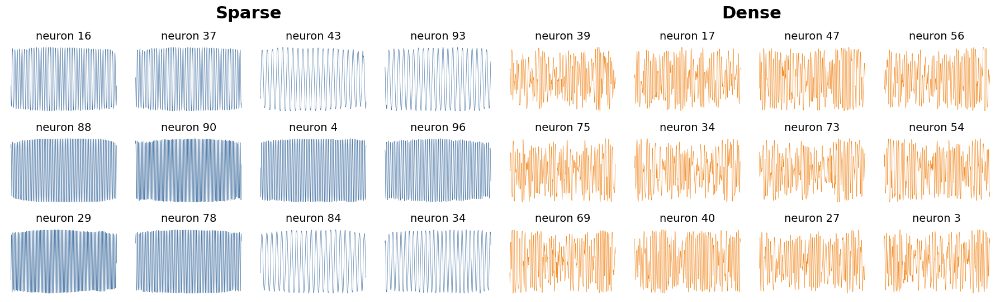

In [51]:
# Define the colors
colors = {'sparse': '#4E79A7', 'dense': '#F28E2B'}

# Create a larger figure
plt.figure(figsize=(18, 5.5))

# Number of subplots to sample
num_plots = 12

# Randomly select indices for sparse features
indxs_sparse = np.random.choice(np.arange(features_sparse.shape[0]), num_plots, replace=False).astype(int)
# Plot the sparse features (left 3x4 grid)
for i, indx in enumerate(indxs_sparse):
    row = i // 4
    col = i % 4
    plt.subplot(3, 8, row * 8 + col + 1)
    plt.title('neuron ' + str(indx), fontsize=14)
    plt.plot(features_sparse[indx].flatten(), linewidth=0.5, color=colors['sparse'], alpha=1)
    plt.axis('off')

# Randomly select indices for dense features
indxs_dense = np.random.choice(np.arange(features_dense.shape[0]), num_plots, replace=False).astype(int)
# Plot the dense features (right 3x4 grid)
for i, indx in enumerate(indxs_dense):
    row = i // 4
    col = i % 4
    plt.subplot(3, 8, row * 8 + col + 5)
    plt.title('neuron ' + str(indx), fontsize=14)
    plt.plot(features_dense[indx].flatten(), linewidth=0.5, color=colors['dense'], alpha=1)
    plt.axis('off')

# Add titles
plt.figtext(0.25, 0.95, 'Sparse', ha='center', va='center', fontsize=22, fontweight='bold', color='black')
plt.figtext(0.75, 0.95, 'Dense', ha='center', va='center', fontsize=22, fontweight='bold', color='black')

plt.tight_layout(rect=[0, 0, 1, 0.92])  # Adjust layout to make space for the titles

plt.savefig('plots/fig4/C_deconvWaves_v2.svg', dpi=600)

plt.show()